In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
sns.set(style='whitegrid', palette='Set2')

---

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров.
_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>, но использовать нужно выданные данные.

_____________

**Что сделать:**

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. 
* Найти рестораны с наилучшими отзывами.


Далее в условии встречаются различные подсказки, как можно выполнить определенные части задачи. Вы можете их игнорировать и делать иным способом для получения того же самого промежуточного результата.

---

In [5]:
df = pd.read_csv('yelp_business.csv')
df.head()

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


In [6]:
city_counts = df.groupby('city').size().reset_index(name='count')

sorted_cities = city_counts.sort_values(by='count', ascending=False)

sorted_cities.head()

,city,count
424,Las Vegas,26775
713,Phoenix,17213
983,Toronto,17206
143,Charlotte,8553
871,Scottsdale,8228


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- e7cca0cc751f37cd60e6ee92b5464ba1 -->
Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

In [7]:
las_vegas_df = df[df['city'] == 'Las Vegas']

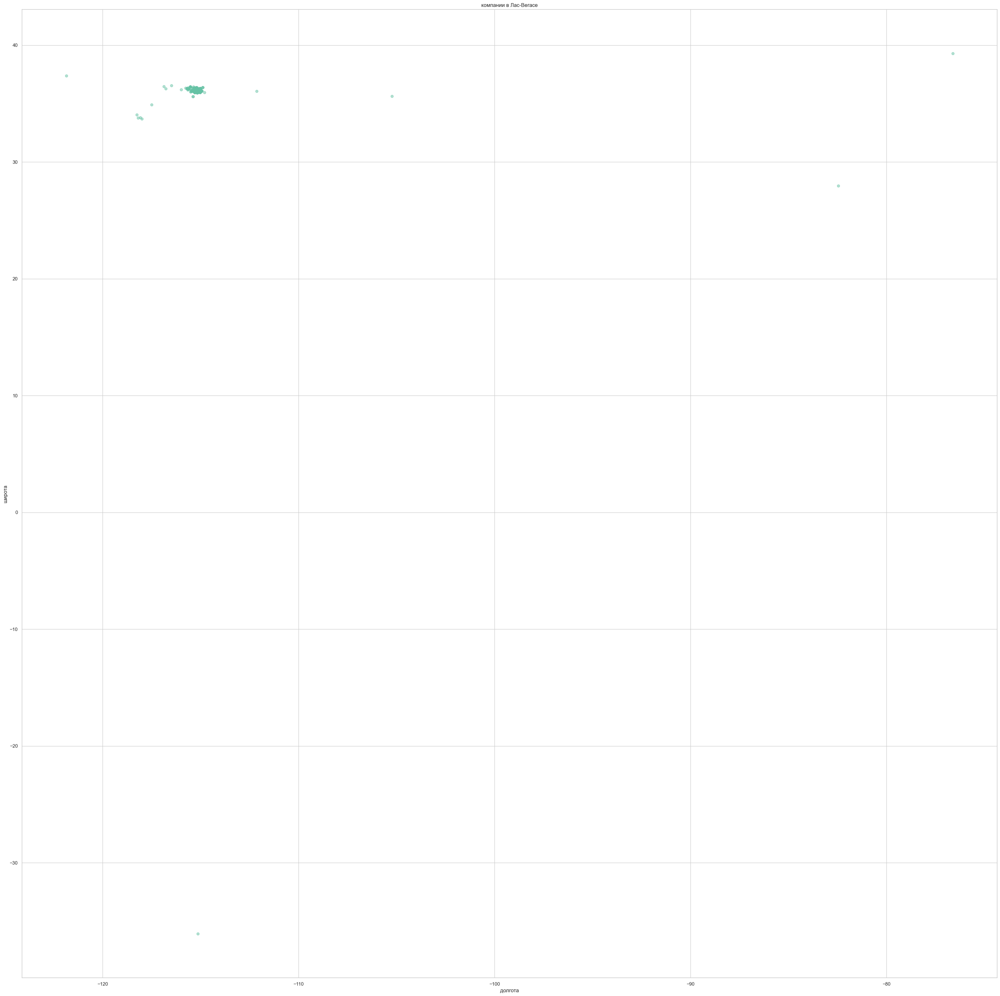

In [8]:
plt.figure(figsize=(40, 40))
plt.scatter(las_vegas_df['longitude'], las_vegas_df['latitude'], alpha=0.5)

plt.xlabel('долгота')
plt.ylabel('широта')
plt.title('компании в Лас-Вегасе')

plt.show()

In [9]:
las_vegas_df_filtered = las_vegas_df[(las_vegas_df['longitude'] < -115) & (las_vegas_df['longitude'] > -115.36) & (las_vegas_df['latitude'] > 35.9)  & (las_vegas_df['latitude'] < 36.33)]

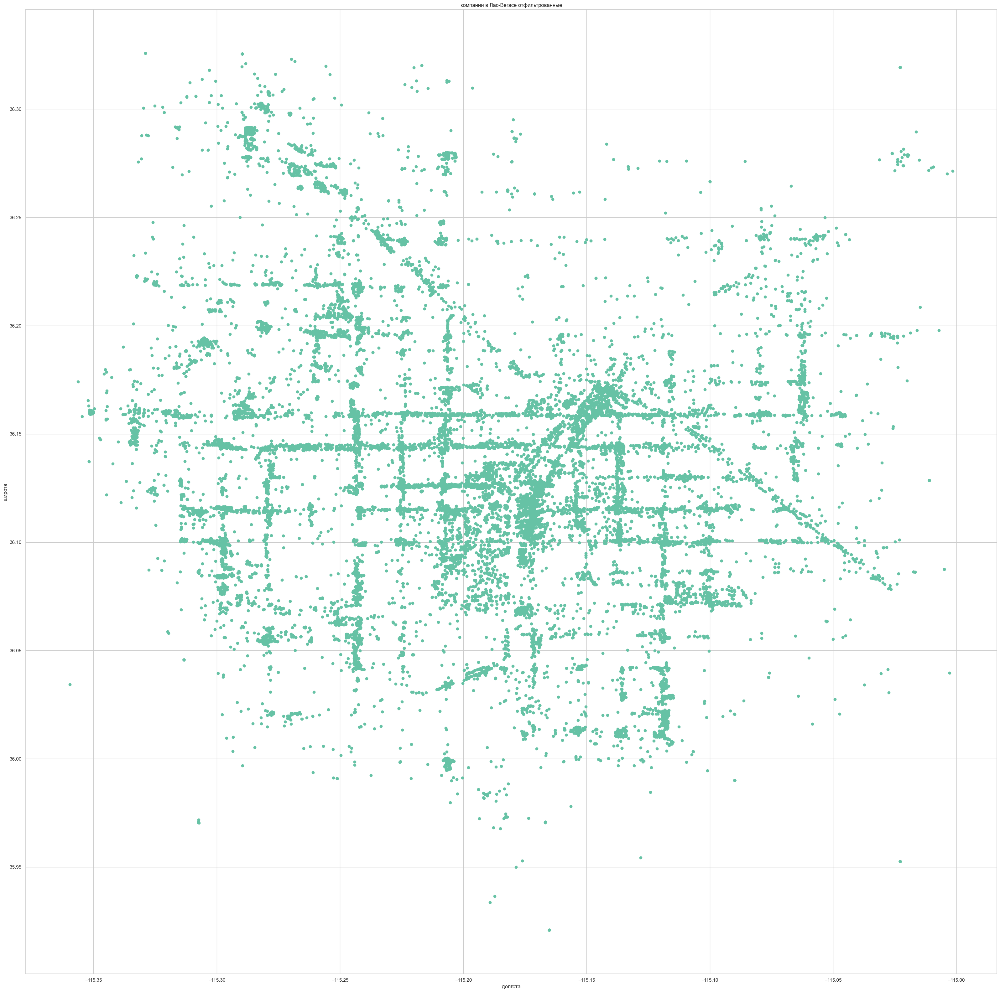

In [10]:
plt.figure(figsize=(40, 40))
plt.scatter(las_vegas_df_filtered['longitude'], las_vegas_df_filtered['latitude'], alpha=1) 

plt.xlabel('долгота')
plt.ylabel('широта')
plt.title('компании в Лас-Вегасе отфильтрованные')

plt.show()

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика.

In [11]:
fig = px.scatter_mapbox(las_vegas_df_filtered,
                        lat='latitude',
                        lon='longitude',
                        hover_name='name',
                        mapbox_style='carto-positron',
                        zoom=10)

fig.update_layout(mapbox_style="carto-positron",
                  mapbox=dict(center=dict(lat=36.1699, lon=-115.1398),
                  zoom=10))

fig.show()

/var/folders/yy/kcg6r_q12sx5f223zmq6hrs80000gn/T/ipykernel_32076/3746751638.py:1: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(las_vegas_df_filtered,


#### Оценки компаний


In [12]:
df_review = pd.read_csv('yelp_review.csv')
df_review.head()

,Unnamed: 0,business_id,stars
0,0,AEx2SYEUJmTxVVB18LlCwA,5
1,1,VR6GpWIda3SfvPC-lg9H3w,5
2,2,CKC0-MOWMqoeWf6s-szl8g,5
3,3,ACFtxLv8pGrrxMm6EgjreA,4
4,4,s2I_Ni76bjJNK9yG60iD-Q,4


In [13]:
df_review.set_index('business_id', inplace=True)
las_vegas_ratings = df_review.loc[las_vegas_df['business_id']]

las_vegas_ratings.head()

,Unnamed: 0,stars
business_id,,
kCoE3jvEtg6UVz5SOD3GVw,456053,4
kCoE3jvEtg6UVz5SOD3GVw,1093900,1
kCoE3jvEtg6UVz5SOD3GVw,2039047,5
kCoE3jvEtg6UVz5SOD3GVw,2979380,5
kCoE3jvEtg6UVz5SOD3GVw,4844650,5


Посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок.

In [14]:
ratings_avr = las_vegas_ratings.groupby('business_id')['stars'].agg(['mean', 'size'])
ratings_avr.head()

,mean,size
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19


In [15]:
ratings_avr.rename(columns={'mean': 'rating', 'size': 'rating_num'}, inplace=True)
ratings_avr.head()

,rating,rating_num
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19


Соедините две полученные ранее таблицы по компаниям города `N` в одну.

In [16]:
merged_df = las_vegas_df.join(ratings_avr, on='business_id')
merged_df.reset_index(inplace=True)
merged_df.head()

,index,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories,rating,rating_num
0,6,6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...,4.000000,5
1,7,7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods,1.444444,9
2,26,26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23
3,41,41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20
4,48,48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. 

In [30]:
fig = px.scatter_mapbox(merged_df, 
                        lat="latitude", 
                        lon="longitude", 
                        color="rating",
                        opacity=0.3,
                        zoom=10,
                        hover_name='name',  
                        hover_data=['categories', 'rating', 'rating_num'])

fig.update_layout(mapbox_style="carto-positron",
                  mapbox=dict(center=dict(lat=36.1699, lon=-115.1398),
                  zoom=10))
fig.show()

/var/folders/yy/kcg6r_q12sx5f223zmq6hrs80000gn/T/ipykernel_32076/3144938453.py:1: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района.

In [18]:
grid_size = 0.25

merged_df['lat_rounded'] = np.round(merged_df['latitude'] / grid_size, decimals = 1) * grid_size
merged_df['lon_rounded'] = np.round(merged_df['longitude'] / grid_size, decimals = 1) * grid_size

merged_df_filtered = merged_df[(merged_df['longitude'] < -115) & (merged_df['longitude'] > -115.36) & (merged_df['latitude'] > 35.9)  & (merged_df['latitude'] < 36.33)]

merged_df_filtered[['lat_rounded', 'lon_rounded']].head()

,lat_rounded,lon_rounded
0,36.200,-115.275
1,36.200,-115.250
2,36.075,-115.125
3,36.050,-115.275
4,36.100,-115.050


In [19]:
pivot_df = pd.pivot_table(merged_df_filtered, 
                             index='lat_rounded', 
                             columns='lon_rounded', 
                             values='rating', 
                             aggfunc='mean')

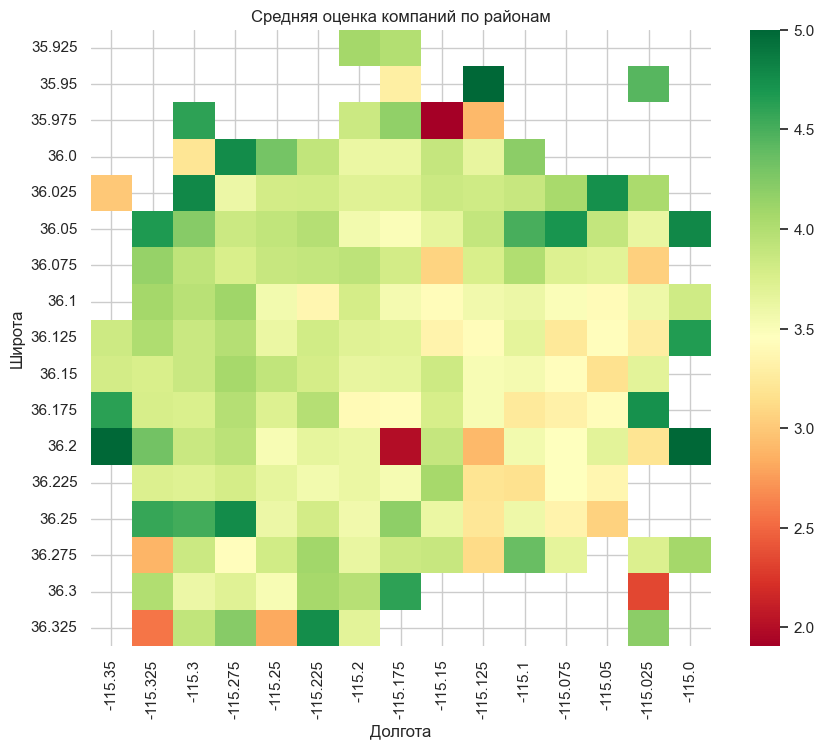

In [20]:
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_df, cmap="RdYlGn")

plt.title('Средняя оценка компаний по районам')
plt.xlabel('Долгота')
plt.ylabel('Широта')

plt.show()

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- b4c4e083ebff2a19367f2df3097fcc53 -->
Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** Если в районе мало компаний, то оценка района сильно зависит от каждой из них. Например, если в районе всего одна компания и ее рейтинг 5, это не значит, что район хороший. Или если одна компания с рейтингом 2, не значит, что район плохой. Я думаю, что именно такие районы в центре и по центру сверху. А визуально они сильно выделяются на карте, поэтому выводы могут быть неправильными.

Если все районы имеют высокую оценку, например 4-5, нельзя красить районы с оценкой 4 в красный цвет, потому что отличия на самом деле не очень значительные. Такая же проблема, если все районы имеют низкую оценку.

In [21]:
district_counts = merged_df_filtered.groupby(['lat_rounded', 'lon_rounded']).size().reset_index(name='counts')

district_counts_filtered = district_counts[district_counts['counts'] >= 30]

filtered_df_2 = merged_df_filtered.merge(district_counts_filtered, on=['lat_rounded', 'lon_rounded'], how='inner')

pivot_df = pd.pivot_table(filtered_df_2, 
                             index='lat_rounded', 
                             columns='lon_rounded', 
                             values='rating', 
                             aggfunc='mean')

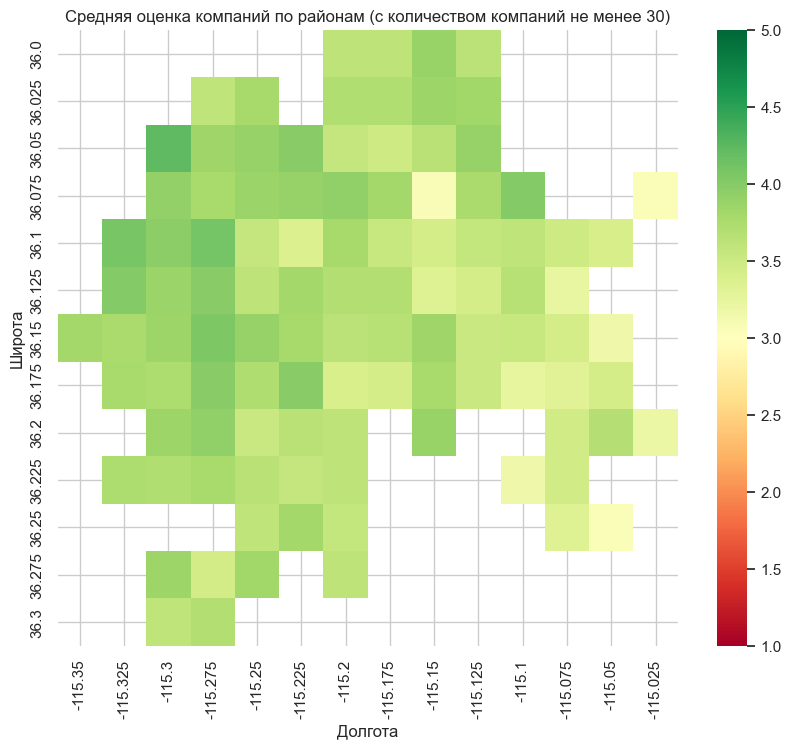

In [22]:
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_df, cmap="RdYlGn", vmin=1, vmax=5)

plt.title('Средняя оценка компаний по районам (с количеством компаний не менее 30)')
plt.xlabel('Долгота')
plt.ylabel('Широта')

plt.show()

Действительно на втором графике видно, что в районах, где оценка была либо очень высокой, либо очень низкой, компаний мало. На второй карте по городу везде примерно одинаковые оценки у районов. Есть некий рост при движении на северо-запад, но он не очень значительный (я посмотрела в интернете, это район Беверли-Хиллз, то есть вроде наиболее популярный). На первом графике не было заметно никакой системы в оценках районов.


#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`.
Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [28]:
restaurant_df = merged_df_filtered[merged_df_filtered['categories'].str.contains('estaurant', case=False, na=False)]

restaurant_df_filtered = restaurant_df[restaurant_df['rating_num'] >= 5]

In [29]:
district_counts_restaurants = restaurant_df.groupby(['lat_rounded', 'lon_rounded']).size().reset_index(name='counts')

district_counts_restaurants_filtered = district_counts_restaurants[district_counts_restaurants['counts'] >= 10]

filtered_df_2_restaurants = restaurant_df.merge(district_counts_restaurants_filtered, on=['lat_rounded', 'lon_rounded'], how='inner')

pivot_df_restaurants = pd.pivot_table(filtered_df_2_restaurants, 
                             index='lat_rounded', 
                             columns='lon_rounded', 
                             values='rating', 
                             aggfunc='mean')

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** Можно не беспокоиться о том, что оценка ресторана "выброс", потому что если оценок мало, то каждая из них имеет большой вклад, а оценка от человека может быть сильно рандомной. То же самое для ресторана в районе. Выше уже было написано, что 1-2 плохих ресторана в районе не делают район плохим. Если поставить ограничения, то меньше вероятность, что будут выбросы в обоих случаях.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. 

In [25]:
restaurant_df_filtered_vasily = restaurant_df[restaurant_df['rating_num'] >= 50]

top_restaurants = restaurant_df_filtered_vasily.sort_values(by='rating', ascending=False)
top_restaurants[['rating', 'rating_num', 'latitude', 'longitude', 'categories']].head(10)

,rating,rating_num,latitude,longitude,categories
3614,4.966480,179,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...
25483,4.907692,65,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
16666,4.890909,55,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
25807,4.868132,91,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...
2138,4.848069,1165,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
19011,4.836538,104,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
12058,4.833333,180,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes
11961,4.816754,191,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...
5360,4.809524,63,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...
25372,4.807018,57,36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;...


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 3dfd6f8a8d445e64850dc7cb2d5beca9 -->
Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [26]:
top_top_restaurants = top_restaurants.iloc[:11]
top_restaurants = top_restaurants.iloc[10:]

In [31]:
fig_top = px.scatter_mapbox(top_top_restaurants, 
                        lon='longitude', 
                        lat='latitude', 
                        hover_name='name',
                        hover_data={'rating': True, 'rating_num': True},
                        color_discrete_sequence=['red'], 
                        mapbox_style='carto-positron',
                        zoom=10)

fig_rest = px.scatter_mapbox(top_restaurants, 
                        lon='longitude', 
                        lat='latitude', 
                        hover_name='name',
                        hover_data={'rating': True, 'rating_num': True},
                        mapbox_style='carto-positron',
                        zoom=10)

fig_top.add_trace(fig_rest.data[0])

fig_top.show()

/var/folders/yy/kcg6r_q12sx5f223zmq6hrs80000gn/T/ipykernel_32076/1045256508.py:1: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/yy/kcg6r_q12sx5f223zmq6hrs80000gn/T/ipykernel_32076/1045256508.py:10: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



Василий сначала смотрит на рейтинг, но если рейтинг высокий, но отзывов мало, он будет сомневаться в его надёжности. Он предпочитает стабильность при выборе ресторана.

1. На тех данных которые изучали нет особых закономерностей корреляций рейтинга компаний/ресторанов с их расположением.
2. Очень важно обрабатывать данные перед работой с ними, потому что на графиках перед обработкой и после обработки есть очень сильные отличия,которые сильно влияют на восприятие информации.
3. По интерактивным катам сложно сделать какие-то выводы о областях карты, в этих случаях может быть полезно агригировать данные по районам/любым другим признакам и смотреть на меньшее количество более понятных точек.
4. Иногда выбросы сильно влияют на общее восприятие данных (в данной ситуации выбросы как по количеству организаций в районе, так и по количеству отзывов в организации).